Install BeamEstimation Package. 
OIFITS.jl should be installed from the master of Eric repository:
```julia
using Pkg
Pkg.add(url="https://github.com/ferreolS/BeamEstimation.jl")
Pkg.add(url="https://github.com/emmt/OIFITS.jl.git#master")
```
Plots and PlotlyJS should also be installed for better plots

In [1]:
using Revise
using OIFITS,Unitful,Printf
using Plots
plotlyjs()

using BeamEstimation

┌ Warning: backend `PlotlyJS` is not installed.
└ @ Plots /Users/ferreol/.julia/packages/Plots/sxUvK/src/backends.jl:43


## Read OIFits file

In [2]:
filename = "/Users/ferreol/Documents/Projets/JMMC/MFIR/EcoleVLTI/StellarDisk.RCar/data/R_CAR_all.fits"
oi = OIDataSet(filename);
diameter = max(1.8,maximum(oi.array[1].diameter))*1u"m"

λ =  [v2.instr.eff_wave  .* 1u"m" .|> u"μm" for v2 in oi.vis2] 
λmax = maximum(maximum.(λ))
λmin = minimum(minimum.(λ))

@printf("TARGET : %s\n", oi.target[1].target)
@printf("Array : %s \n", oi.array[1].arrname)
@printf("Diameter : %s \n", diameter)
@printf("%s","Wavelengths : $λmin ≤ λ ≤ $λmax \n")
@printf("Number of Vis2 tables: %d \n", length(oi.vis2))

TARGET : R_CAR
Array : VLTI 


Diameter : 1.8 m 
Wavelengths : 1.6109640910144662 μm ≤ λ ≤ 1.737299839987827 μm 


Number of Vis2 tables: 9 


## Build the uvplane from the baseline and wavelength given in the Vis2 tables:

In [3]:

uv = [uvplane(v2.ucoord .* 1u"m"  ,v2.vcoord .* 1u"m" , v2.instr.eff_wave.* 1u"m" ) for v2 in oi.vis2] 
all_uv = hcat(uv...); # cat the uv plane of all Vis2 tables


## Compute the size of the field of view and pixels:

In [4]:
pixsize = maxpixsize(all_uv)/2
fov = maxfov(λmax,diameter)
@printf("pixel size : %s \n", pixsize)
@printf("field of view  : %s \n", fov)



pixel size : 0.6284631438878363 mas 
field of view  : 199.07989716011147 mas 


## Estimate the beam size

In [5]:
rx,ry,θ = BeamEstimation.fastbeam(all_uv)
@printf("major axis : %s \n", rx)
@printf("minor axis : %s \n", ry)
@printf("principal angle : %s \n", θ|> u"°" )


major axis : 1.4813891301111912 mas 
minor axis : 1.2770641090473278 mas 


principal angle : -52.091171034675185° 


## Plots

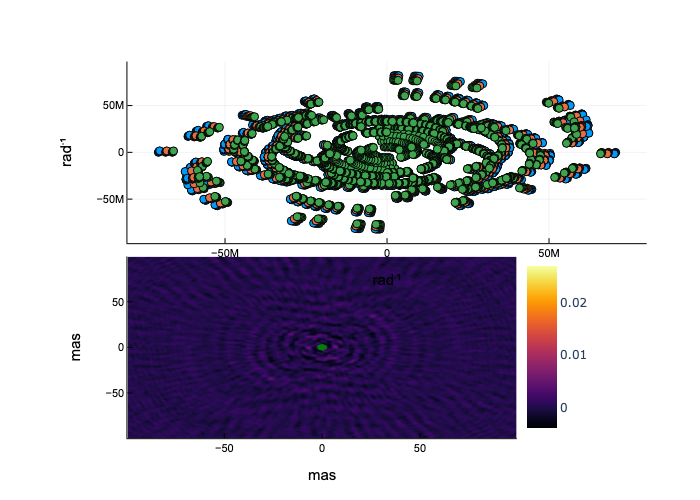

In [6]:
p = BeamEstimation.plotuv(all_uv,aspectmode =:manual,aspect_ratio=:equal)
beam = dirtybeam(all_uv,fov, pixsize)
b= BeamEstimation.plotimage(beam,fov)
b = BeamEstimation.plotbeam!(b,rx,ry,θ;color="green")

plot(p, b,layout = (2,1),size=(700,1000))

## On a smaller uv coverage

major axis : 1.898031151129151 mas 
minor axis : 1.5986262701415388 mas 
principal angle : -142.8967320017167° 


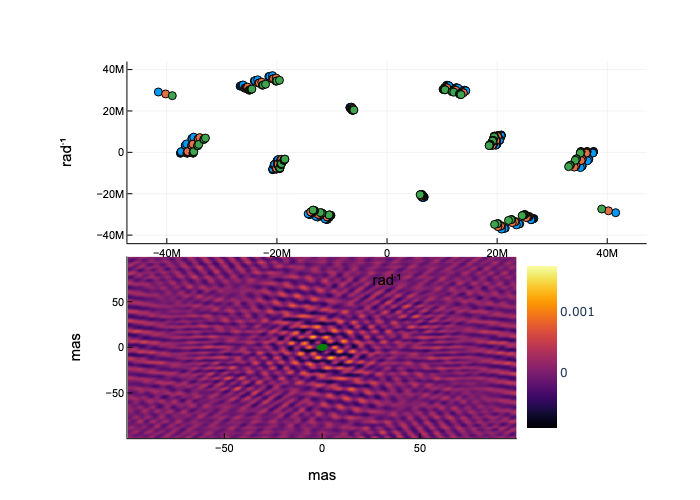

In [7]:
n =3 #  table number
beam = dirtybeam(uv[n],fov, pixsize)
rx,ry,θ = BeamEstimation.fastbeam(uv[n])
@printf("major axis : %s \n", rx)
@printf("minor axis : %s \n", ry)
@printf("principal angle : %s \n", θ|> u"°" )
p = BeamEstimation.plotuv(uv[n],aspectmode =:manual,aspect_ratio=:equal)
b = BeamEstimation.plotimage(beam,fov)
b = BeamEstimation.plotbeam!(b,rx,ry,θ;color="green")

plot(p, b,layout = (2,1),size=(700,1000))